# Habitat time series modelling of fish off Peru

This script has an attempt to model a spatial and temporal dataset of fish distribution off Peru. The data has estimates of abundance measured during cruise transects off Peru. There are about 2 to 3 cruises per year and the environmental variables as well as latitude and longitude were recorded for every sample.

## Methods and results
The following script shows the code to analyse the data.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd

from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier

from sklearn import metrics
from sklearn.model_selection import train_test_split

### Input and loading the data

In [2]:
plt.style.use('bmh')
y_cm = cm.flag

dataPath ="Spatial_dataset.xlsx"

myvar = "anc"
envars = ['shelf','dc', 'prof', 'sst', 'sss', 'chl', 'oxi', 'oxiP'] # Environmental variables
myvars = ['anc', 'sar', 'jur', 'cab', 'mun', 'sam', 'bag', 'fvo', 'pot', 'vin', 'mic','zoo', 'dem', 'mer', 'cam'] # Response variables
spNames = ['Anchovy', 'Sardine','Jack mackerel', 'Chub mackerel', 'Squat lobster', 'White anchovy', 'Cat fish', 'False flying fish', 'Humboldt squid', 'Lightfish', 'Lantern fish', 'Zooplankton', 'Demersals', 'Hake', 'Camotillo'] # Species names

predloc = [6,14]
splitSize = 0.1
timeCol = 5 # Column with the time in decimal years
tdiff = 0.05 # Maximum difference from the mean to group cruises by time
balanced = 0

axLims = [-90, -70, -20, 0] # Axis limits for the scatter plots [x1, x2, y1, y2]

In [3]:
# Import data
df = pd.read_excel(dataPath)

### Data exploration

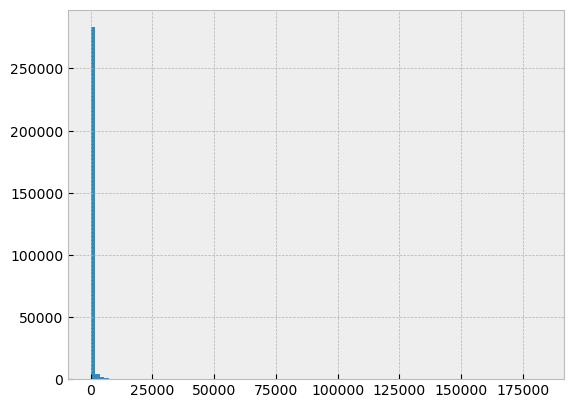

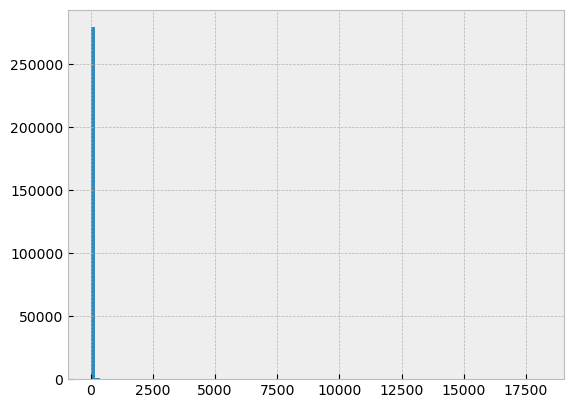

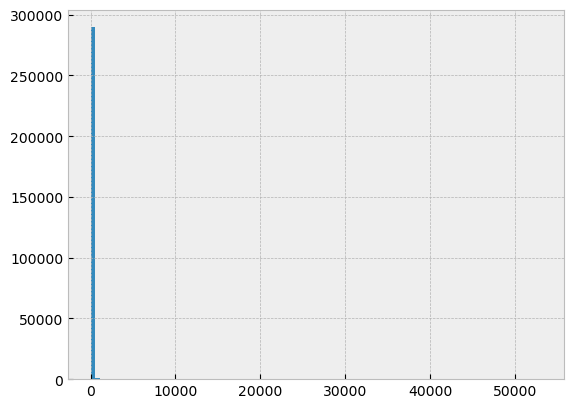

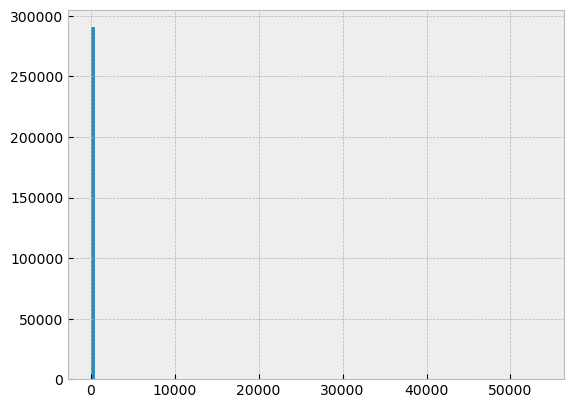

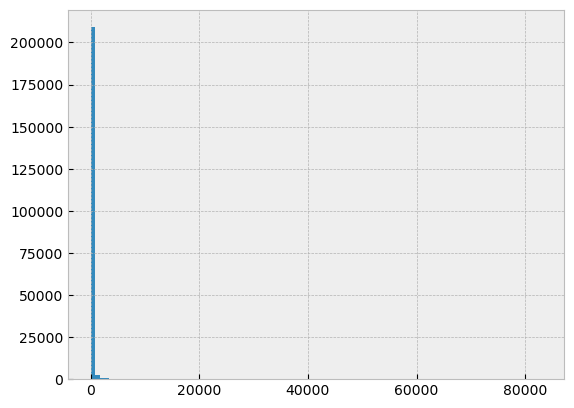

...

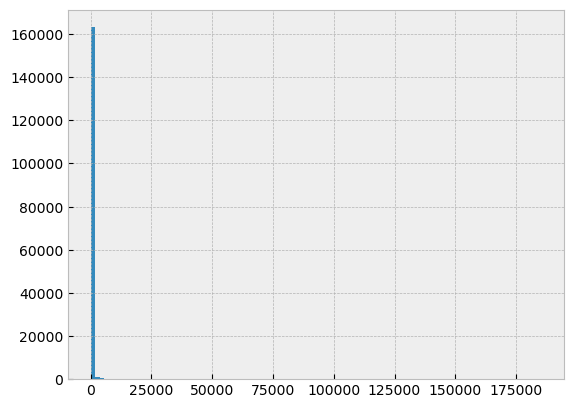

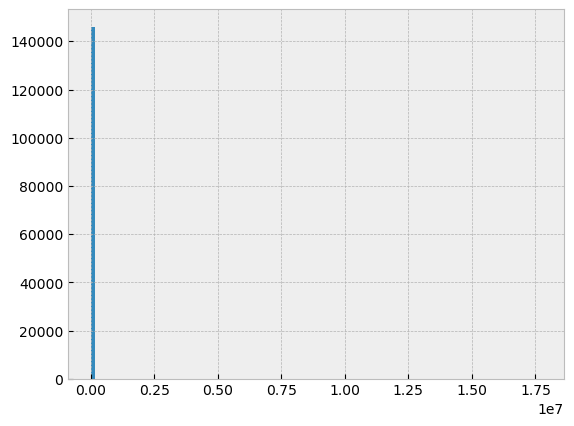

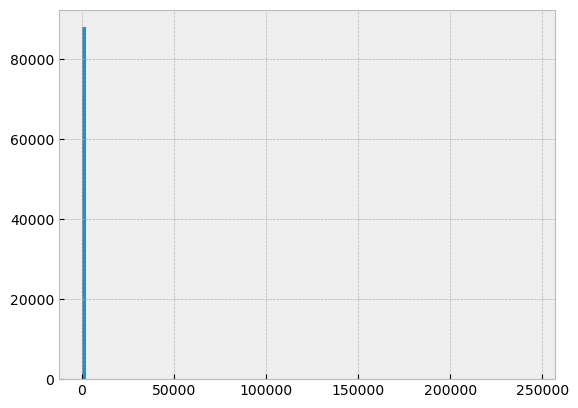

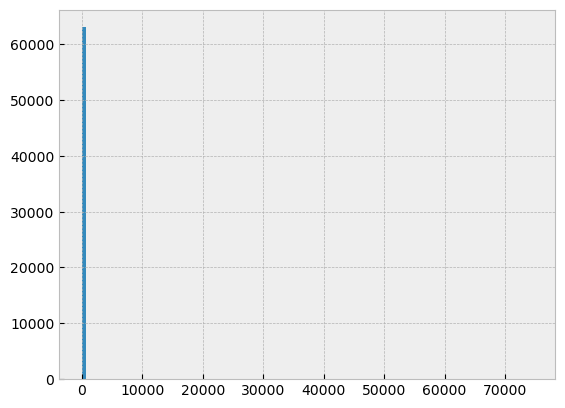

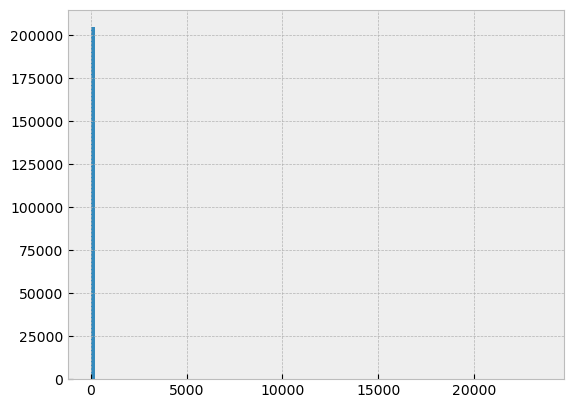

In [4]:
for i in myvars:
    plt.hist(df[i], bins=100)
    plt.show()

The data has outliers and most of the values are zeros. For the following analysis, I'll check only the anchovies.
First I'll remove the 0's to try to see the other values.

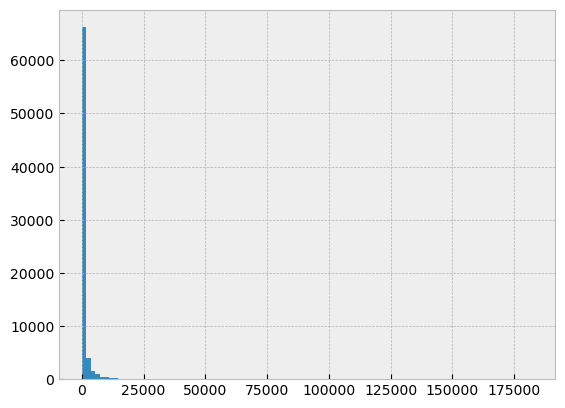

In [5]:
# Mask 0's
newvar = df[myvar].mask(df[myvar] == 0)
plt.hist(newvar,bins=100)
plt.show()

Here we can see a Poisson distribution with lot's of values close to zero and then very high outliers. In the next step I'll remove the outliers.

Isolate values within the 95% interval (excluding 0's) to remove outliers.

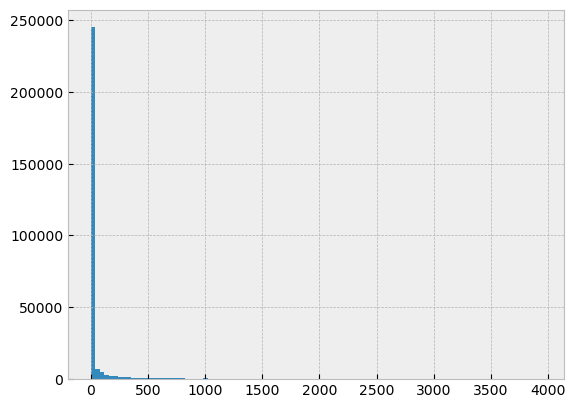

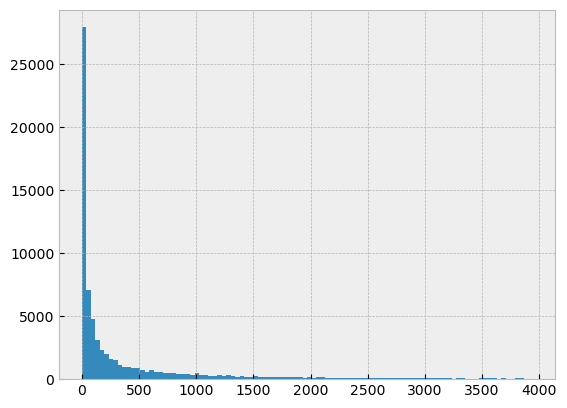

In [6]:
q95 = newvar.quantile(q=0.95)
var95 = df[myvar].mask(df[myvar] > q95)
var95No0 = var95.mask(var95  == 0) # Masks the 0's just for plotting
plt.hist(var95,bins=100)
plt.show()
plt.hist(var95No0, bins = 100)
plt.show()

Plot a simple timeseries.
I don't want connections between cruises so I'll use a scatter plot.

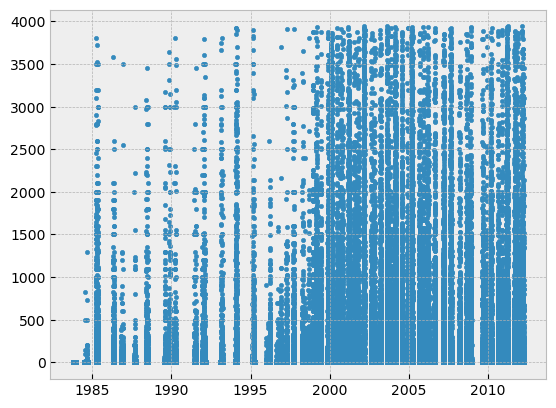

In [7]:
plt.scatter(df.time, var95, marker=".")
plt.show()

Get some smaller interval to search for a seasonallity

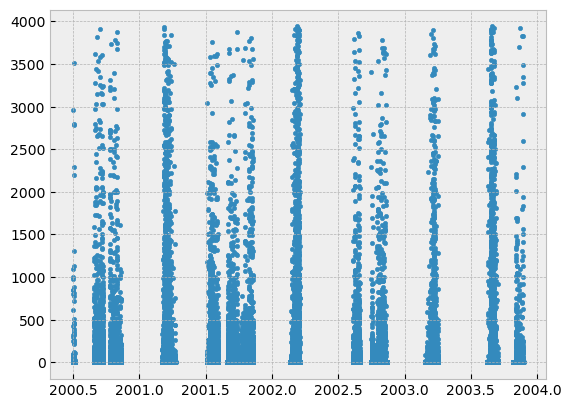

In [8]:
inter = [100000,170000]
plt.scatter(df.time[inter[0]:inter[1]], var95[inter[0]:inter[1]], marker=".")
plt.show()

Average over each season to get only semestral time-steps.

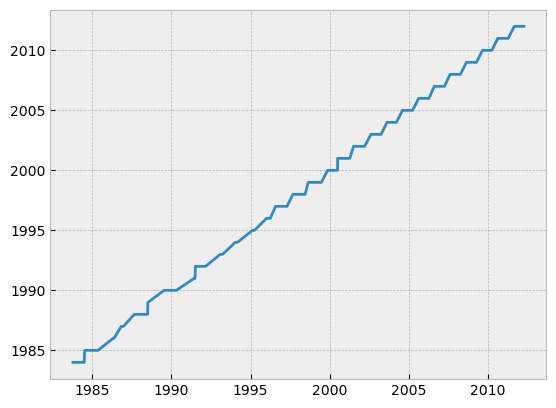

<function matplotlib.pyplot.show(close=None, block=None)>

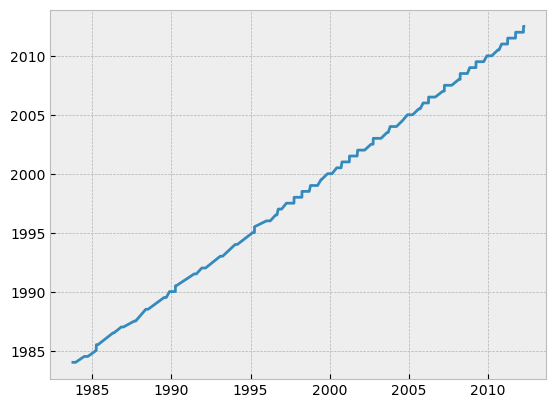

In [9]:
avTime = np.round(df.time, 0)

plt.plot(df.time,avTime)
plt.show()

for i in range(0,len(avTime)):
    
    if np.abs((df.time[i] - avTime[i])) < 0.25:
        avTime[i] = avTime[i]
        
    else:
        if (df.time[i] - avTime[i]) < 0:
            avTime[i] = avTime[i] - 0.5
        else:
            avTime[i] = avTime[i] + 0.5

plt.plot(df.time,avTime)
plt.show

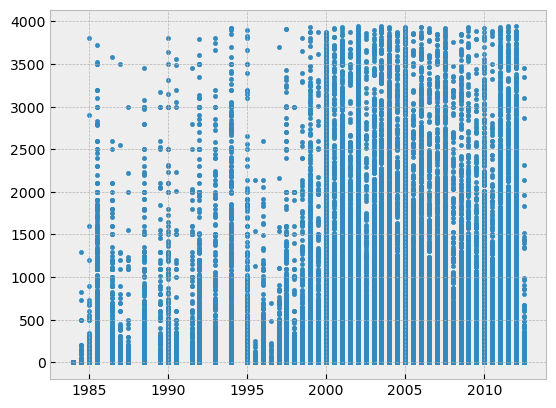

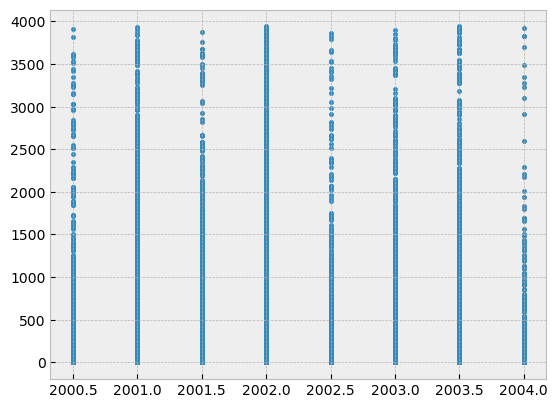

In [10]:
plt.scatter(avTime, var95, marker=".")
plt.show()

plt.scatter(avTime[inter[0]:inter[1]], var95[inter[0]:inter[1]], marker=".")
plt.show()

Check for correlations between environmental and response variables

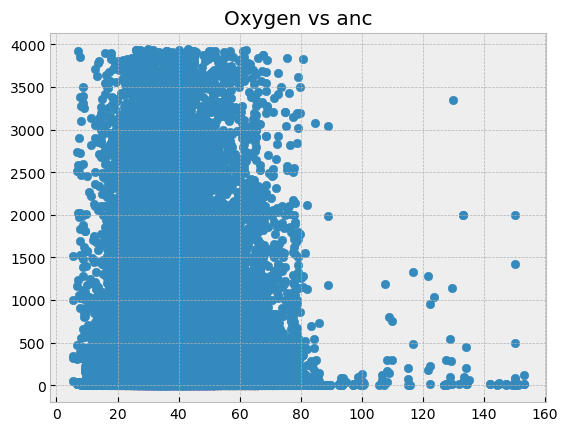

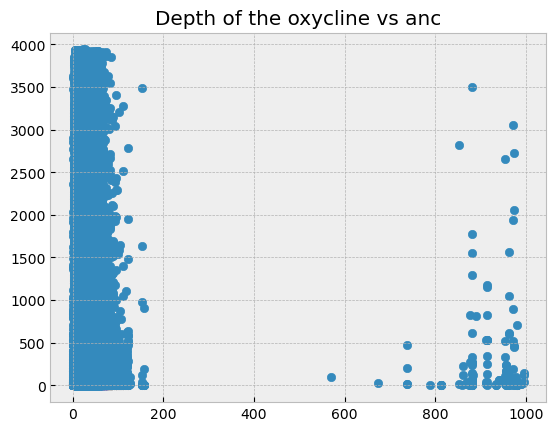

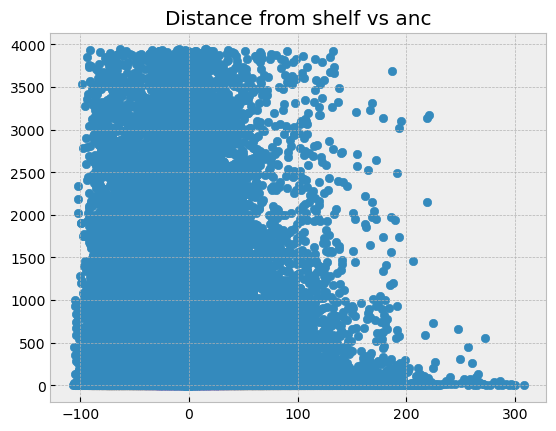

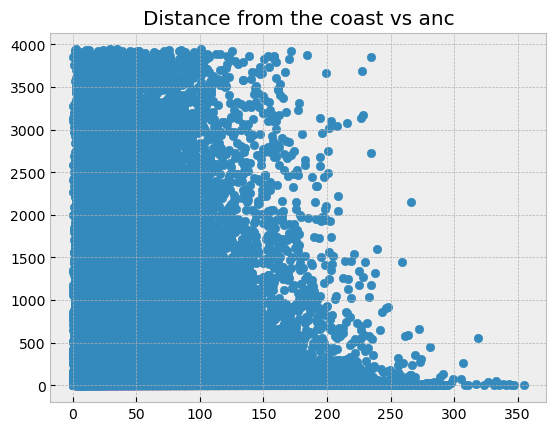

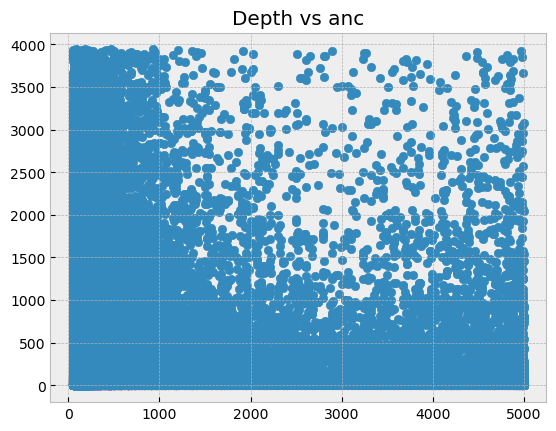

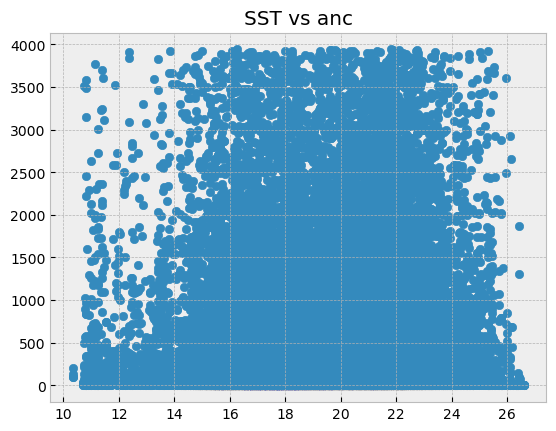

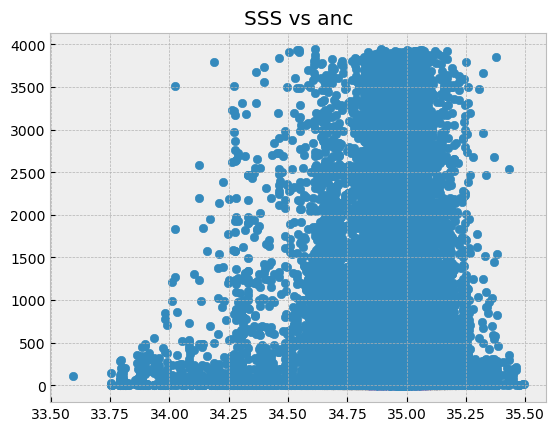

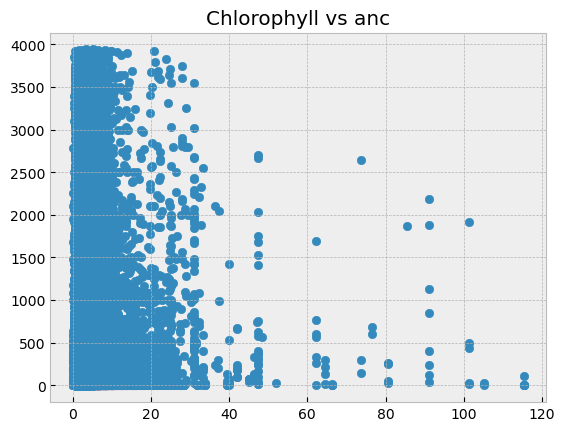

In [11]:
plt.scatter(df.oxi,var95No0)
plt.title("Oxygen vs "+myvar)
plt.show()
plt.scatter(df.oxiP,var95No0)
plt.title("Depth of the oxycline vs "+myvar)
plt.show()
plt.scatter(df.shelf,var95No0)
plt.title("Distance from shelf vs "+myvar)
plt.show()
plt.scatter(df.dc,var95No0)
plt.title("Distance from the coast vs "+myvar)
plt.show()
plt.scatter(df.prof,var95No0)
plt.title("Depth vs "+myvar)
plt.show()
plt.scatter(df.sst,var95No0)
plt.title("SST vs "+myvar)
plt.show()
plt.scatter(df.sss,var95No0)
plt.title("SSS vs "+myvar)
plt.show()
plt.scatter(df.chl,var95No0)
plt.title("Chlorophyll vs "+myvar)
plt.show()

Correlations between different species

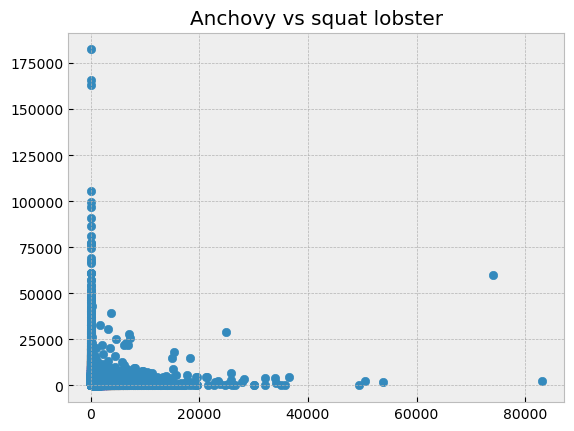

In [12]:
plt.scatter(df.mun,df.anc)
plt.title("Anchovy vs squat lobster")
plt.show()

### Regression

Now let's try to predict absolute values with a regression. For now I'll just focus on one species.

#### Pre-porcessing

In [13]:
print(df.columns)

# Environmental variables
print(df.columns[6:14])

# Response variable
print(df["anc"].shape)

# Remove outliers
newvar = df[myvar].mask(df[myvar] == 0)
q95 = newvar.quantile(q=0.95)

# Put NaNs where values are larger than q95
var95 = df.mask(df[myvar] > q95)
df[myvar][df[myvar] > q95] = np.nan

# Pick the response variable
exec("y0 = df."+myvar)
y0 = df[myvar]

# Pick the predictors
x0 = df.iloc[:,6:14]#[:,6:15]
print(x0)
print(y0)

# Remove nan's
x0["var"] = y0
xnan = x0.dropna()
print(xnan)

# Separate predictor and response variable again
xx = xnan.iloc[:,0:-1]
yy = xnan.iloc[:,-1]
print(yy)

Index(['lon', 'lat', 'year', 'month', 'day', 'time', 'shelf', 'dc', 'prof',
       'sst', 'sss', 'chl', 'oxi', 'oxiP', 'masas', 'anc', 'ancp', 'ancg',
       'sar', 'jur', 'cab', 'mun', 'sam', 'bag', 'fvo', 'pot', 'vin', 'mic',
       'zoo', 'dem', 'mer', 'otr', 'cam', 'unclassified', 'Unnamed: 34',
       'BOOL ANC', 'BOOL SAR', 'AMBAS', 'Unnamed: 38', 'Unnamed: 39'],
      dtype='object')
Index(['shelf', 'dc', 'prof', 'sst', 'sss', 'chl', 'oxi', 'oxiP'], dtype='object')
(307243,)
         shelf      dc         prof  sst  sss  chl  oxi  oxiP
0       80.045  87.929  2805.173340  NaN  NaN  NaN  NaN   NaN
1       76.501  84.342  2354.189209  NaN  NaN  NaN  NaN   NaN
2       73.048  80.847  2016.665283  NaN  NaN  NaN  NaN   NaN
3       58.327  68.787  1689.872314  NaN  NaN  NaN  NaN   NaN
4       54.590  65.034  1416.297729  NaN  NaN  NaN  NaN   NaN
...        ...     ...          ...  ...  ...  ...  ...   ...
307238 -10.283   1.387   115.449669  NaN  NaN  NaN  NaN   NaN
307239 -10.134   

/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2120312188.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[myvar][df[myvar] > q95] = np.nan


In [14]:
# Split the data
x_train, x_test, y_train, y_test = train_test_split(xx,yy, test_size = 0.2)

#### Random forest

In [15]:
# create regressor object
regressor = RandomForestRegressor(n_estimators = 100, random_state = 0) # 1000 is much slower and doesn't improve much

In [16]:
# Fit the random forest
fitted = regressor.fit(x_train, y_train)

In [17]:
# Predict some value
y2_train = regressor.predict(x_train)
y2_test = regressor.predict(x_test)

In [18]:
# Check the model

print("\n train: \n")
print("Error sq. train:",metrics.mean_squared_error(y_train, y2_train))
print("R2 train:",metrics.r2_score(y_train, y2_train))

print("\n test: \n")
print("Error sq.:",metrics.mean_squared_error(y_test, y2_test))
print("R2:",metrics.r2_score(y_test, y2_test))


 train: 

Error sq. train: 12249.40106729911
R2 train: 0.9115844978036848

 test: 

Error sq.: 87257.19915083634
R2: 0.3895310063881686


We get a very high R2 in the train set but a low one in the test set so the model is overfitting.

### Classification

Since the regression provided a very bad R2 and the data is highly biased with lot's of 0's, we then tried to simply predict presence absence to assigning 1 to all values above 0. This I'll work with all species.

#### Data pre-processing

In [19]:
def preProcess(df, myvar, predloc, envars, splitSize, timeCol = 5, tdiff = 0.05):
    
    # Pick the response variable
    exec("y0 = df."+myvar)
    y0 = df[myvar]
    print("\n")
    print(myvar)
    print(y0.mean())
    
    # Pick the predictors but keep the time a lat and lon information
    x0 = df.iloc[:,0:predloc[1]]
    
    # Remove nan's
    x0["var"] = y0
    xnan = x0.dropna()
    print(x0["var"].mean())
    
    # Drop duplicate measurements
    xnanUnique = xnan.drop_duplicates(subset = envars)
    
    # Separate predictor and response variable again
    xx = xnanUnique.drop("var", axis = 1)
    xx = np.array(xx)
    yy = xnanUnique["var"]
    print(yy.mean())
    
    # Print the ranges of the environmental variables
    envMin = []
    envMax = []
    for i in range(predloc[0],predloc[1]):
        envMin.append(xx[:,i].min())
        envMax.append(xx[:,i].max())
        print("min "+envars[i-predloc[0]]+": "+str(xx[:,i].min()))
        print("max "+envars[i-predloc[0]]+": "+str(xx[:,i].max()))
    
    # Change all y values to 1 to get a presence-absence model
    yy[yy>0] = 1
    print(yy.mean())
    
    # Group cruises per time
    # Change the time column to a constant time per cruise (here's we'll guess the number of cruises and the time intervals)
    # First group by times where the difference between every single time and their average is not greater than tidff
    xt = np.array(xx[:,timeCol])
    mask = np.abs(xt[:-1] - xt[1:]) <= tdiff
    xtime = np.split(xt, np.where(~mask)[0] + 1)
    # Now get the averages
    xav = []
    for i in range(0,len(xtime)):
        xav.append(xtime[i].mean())
    # Now substitute the time column values
    for i in range(0,len(xav)):
        for j in np.unique(xtime[i][:]):
            xt[xt==j] = xav[i]
    xx[:,timeCol] = xt
    
    # Split train and test datasets
    x_train, x_test, y_train, y_test = train_test_split(xx,yy, test_size = splitSize)
    
    return x_train, x_test, y_train, y_test, xx, yy, envMin, envMax

In [20]:
# Load the variables for all species

x_trains = list()
x_tests = list()
y_trains = list()
y_tests = list()
xxs = list()
yys = list()
envMins = list()
envMaxs = list()
means = list()

for i in range(0,len(myvars)):
    x_train, x_test, y_train, y_test, xx, yy, envMin, envMax = preProcess(df = df, myvar = myvars[i], predloc = predloc, envars = envars, splitSize = splitSize)
    x_trains.append(x_train)
    x_tests.append(x_test)
    y_trains.append(y_train)
    y_tests.append(y_test)
    xxs.append(xx)
    yys.append(yy)
    envMins.append(envMin)
    envMaxs.append(envMax)
    means.append(yy.mean())



anc
97.53912978573221
97.53912978573221
88.47399619032731
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 31.3293151855469
min sss: 33.0674667358398
max sss: 35.6356887817383
min chl: 0.0301486998796463
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 153.021484375
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.2310602421763853


sar


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1


8.92181965583014
8.92181965583014
9.660237203223126
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 31.3293151855469
min sss: 33.0674667358398
max sss: 35.6356887817383
min chl: 0.0301486998796463
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 153.021484375
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.061720437190350946


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1




jur
17.263733325127788
17.263733325127788
19.863879345444577
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 31.3293151855469
min sss: 33.0674667358398
max sss: 35.6356887817383
min chl: 0.0301486998796463
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 153.021484375
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.11861301486055506


cab
8.19725913402116


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1


8.19725913402116
8.434649549770871
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 31.3293151855469
min sss: 33.0674667358398
max sss: 35.6356887817383
min chl: 0.0301486998796463
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 153.021484375
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.09593992445319038


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1




mun
75.83435491412024
75.83435491412024
70.35884466801062
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 27.3447875976562
min sss: 33.5929412841797
max sss: 35.4974937438965
min chl: 0.030578626319766
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 117.88402557373
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.11148345867591473


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1




sam
4.568160500522986
4.568160500522986
2.1008184873607587
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 27.3447875976562
min sss: 33.5929412841797
max sss: 35.4974937438965
min chl: 0.030578626319766
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 117.88402557373
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.0063118932432871195


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1




bag
9.740594524656863
9.740594524656863
8.86066625263307
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 27.3447875976562
min sss: 33.5929412841797
max sss: 35.4974937438965
min chl: 0.030578626319766
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 117.88402557373
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.030131044066651947


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1




fvo
3.7939064300266367
3.7939064300266367
4.149039343509893
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 11.2996520996094
max sst: 27.3447875976562
min sss: 33.5929412841797
max sss: 35.4974937438965
min chl: 0.0435791015625
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 117.88402557373
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.008212678818643286


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1




pot
21.19507124224947
21.19507124224947
29.17149226294662
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 27.3447875976562
min sss: 33.5929412841797
max sss: 35.4974937438965
min chl: 0.030578626319766
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 117.88402557373
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.1726757712377923


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1




vin
423.4221322497189
423.4221322497189
132.14472477527653
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 27.3447875976562
min sss: 33.5929412841797
max sss: 35.4974937438965
min chl: 0.041534423828125
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 117.88402557373
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.22660533407675867


mic
105.98065923379102
105.98065923379102


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1


147.2599702858605
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 26.9859619140625
min sss: 33.6783447265625
max sss: 35.4145469665527
min chl: 0.030578626319766
max chl: 115.367805480957
min oxi: 6.39184522628784
max oxi: 117.88402557373
min oxiP: 0.661929786205292
max oxiP: 163.645401000977
0.09633084996674923


zoo
239.72865421538864
239.72865421538864
11.575477936239077
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 11.2996520996094
max sst: 26.9859619140625
min sss: 33.6783447265625
max sss: 35.4145469665527
min chl: 0.0435791015625
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 117.88402557373
min oxiP: 0.661929786205292
max oxiP: 163.645401000977
0.05693884627053266


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/



dem
13.001330255700177
13.001330255700177
18.490443850625265
min shelf: -105.444
max shelf: 528.915
min dc: 0.085
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.814453125
min sst: 10.2901000976562
max sst: 26.0917358398438
min sss: 34.4831085205078
max sss: 35.2780303955078
min chl: 0.030578626319766
max chl: 29.69775390625
min oxi: 20.6284885406494
max oxi: 117.88402557373
min oxiP: 0.743669092655182
max oxiP: 155.223602294922
0.012800735221715298


mer
3.677926494591251
3.677926494591251
0.09628060200892856
min shelf: -100.408
max shelf: 528.915
min dc: 0.085
max dc: 539.894
min prof: 50.2187232971191
max prof: 4999.5751953125
min sst: 13.7083435058594
max sst: 24.2602233886719
min sss: 34.4831085205078
max sss: 35.2780303955078
min chl: 0.0911097303032875
max chl: 29.69775390625
min oxi: 40.0373497009277
max oxi: 117.88402557373
min oxiP: 1.88872802257538
max oxiP: 155.223602294922
0.0017857142857142857


cam
2.0618881856859526


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/

2.0618881856859526
0.6757946788942114
min shelf: -106.834
max shelf: 528.915
min dc: 0.061
max dc: 539.894
min prof: 50.1748886108398
max prof: 4999.861328125
min sst: 10.2901000976562
max sst: 27.3447875976562
min sss: 33.5929412841797
max sss: 35.4145469665527
min chl: 0.030578626319766
max chl: 115.367805480957
min oxi: 5.37255859375
max oxi: 117.88402557373
min oxiP: 0.276486933231354
max oxiP: 207.298843383789
0.004168106866193603


/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1
/var/folders/w8/nck875wx27sbq527kjwtb8csj2nk90/T/ipykernel_10118/2661169002.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yy[yy>0] = 1


#### Random forest

In [21]:
# Run a random forest for all species.

n_estimators = 100
RFs = list()
predictions = list()
accuracies = list()

print("Accuracy: \n")

for i in range(0,len(myvars)):
    
    if balanced == 0:
        rf = RandomForestClassifier(n_estimators = n_estimators, random_state = 42)
    elif balanced == 1:
        rf = BalancedRandomForestClassifier(n_estimators = n_estimators)
    rf.fit(x_trains[i][:,predloc[0]:-1],y_trains[i]) # Exclude lat, lon and dates from x_trains
    pred = rf.predict(x_tests[i][:,predloc[0]:-1])
    acc = metrics.accuracy_score(y_tests[i], pred)
    
    RFs.append(rf)
    predictions.append(pred)
    accuracies.append(acc)
    
    print(myvars[i]," ",acc,"\n")

Accuracy: 

anc   0.9534787978592013 

sar   0.9763809165333585 

jur   0.965303537501131 

cab   0.9658011399620012 

mun   0.9796726847642551 

sam   0.9975974025974026 

bag   0.9932467532467533 

fvo   0.9981974187035836 

pot   0.9741719242902208 

vin   0.9684056816673304 

mic   0.9889167309175019 

zoo   0.9942578548212351 

dem   0.9960617000328191 

mer   0.9985119047619048 

cam   0.9988478481870552 



The accuracy is generally very good.

### 2D plots of the cruises

#### Grouping data per cruise to plot the predictions

In [24]:
# Function to separate the data by cruise

def cruises_separation(xx,yy):
    cruises_x = list()
    cruises_y = list()
    for i in np.unique(xx[:,timeCol]):
        cruises_x.append(xx[xx[:,timeCol] == i , :])
        cruises_y.append(yy[xx[:,timeCol] == i])
    return cruises_x, cruises_y

In [25]:
cruises_xxs = list()
cruises_yys = list()
cruises_x_trains = list()
cruises_y_trains = list()
cruises_x_tests = list()
cruises_y_tests = list()
cruises_predictions = list()

for i in range(0,len(xxs)):
    cx, cy = cruises_separation(xxs[i], yys[i])
    cruises_xxs.append(cx)
    cruises_yys.append(cy)
    cx, cy = cruises_separation(x_trains[i], y_trains[i])
    cruises_x_trains.append(cx)
    cruises_y_trains.append(cy)
    cx, cy = cruises_separation(x_tests[i], y_tests[i])
    cruises_x_tests.append(cx)
    cruises_y_tests.append(cy)
    cx, cy = cruises_separation(x_tests[i], predictions[i])
    cruises_predictions.append(cy)

In [27]:
len(cruises_y_tests[0])
cruises_x_tests[0][0][:,0] # [Species][Cruise][all rows, column] In this case column = 0 has the longitude

array([-71.3, -82.3, -77.5, -70.7, -81.6, -76.7, -78.3, -81.4, -78.2,
       -78.1, -81.6, -80.1, -80.8, -77.5, -77. , -79.5, -79.5, -80.6,
       -79.2, -78.8, -79. , -77.4, -78.1, -74.8, -73.5, -79.8, -79.4,
       -74.6, -77.7, -79.2, -80.9, -81.3, -78.1, -78.8, -72.6, -78.4,
       -79.9, -74.9, -76.1, -82. , -77.1, -76.7, -73.2, -75.3, -76.9,
       -79.3, -82.1, -75.8, -72.2, -74.8, -75.9, -79. , -81.9, -81.8,
       -76.2, -78.8, -72.9, -76.7, -79.2, -77.4, -77.9, -75.2, -73.1,
       -72.6, -80.2, -77.1, -79.5, -80.8, -77.6, -73.8, -77.1, -79.9,
       -77.3, -79.1, -78.4, -78.2, -79. , -76.2, -76.5, -76.6, -79.6])

#### Plotting the distribution maps of species presence-absence

In [28]:
# Plotting function

nams = ["all", "train", "test", "predictions"]

def plotMaps(x, y, mainTitle, names = spNames, colMap = y_cm, axLims = axLims):
    
    for j in range(0,len(spNames)):
        
        fig, axs = plt.subplots(11,5, figsize=(15, 30))
        fig.suptitle(names[j]+" "+mainTitle, y=0.9)
        fig.subplots_adjust(hspace = .5, wspace = 0.5)#, wspace=.001)
        
        axs = axs.ravel()
        
        for i in range(0,len(x[j])):
            axs[i].scatter(x[j][i][:,0], x[j][i][:,1], s=1, c = y[j][i][:,],cmap=colMap)
            axs[i].set_title(np.around(x[j][i][0,5],2))
            axs[i].set_xlim(axLims[0:2])
            axs[i].set_ylim(axLims[2:])
            
        plt.show()

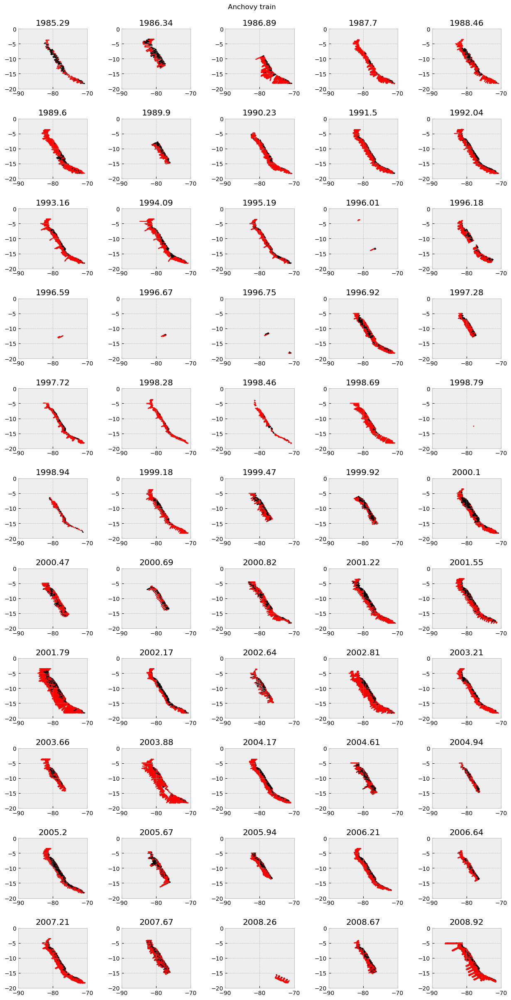

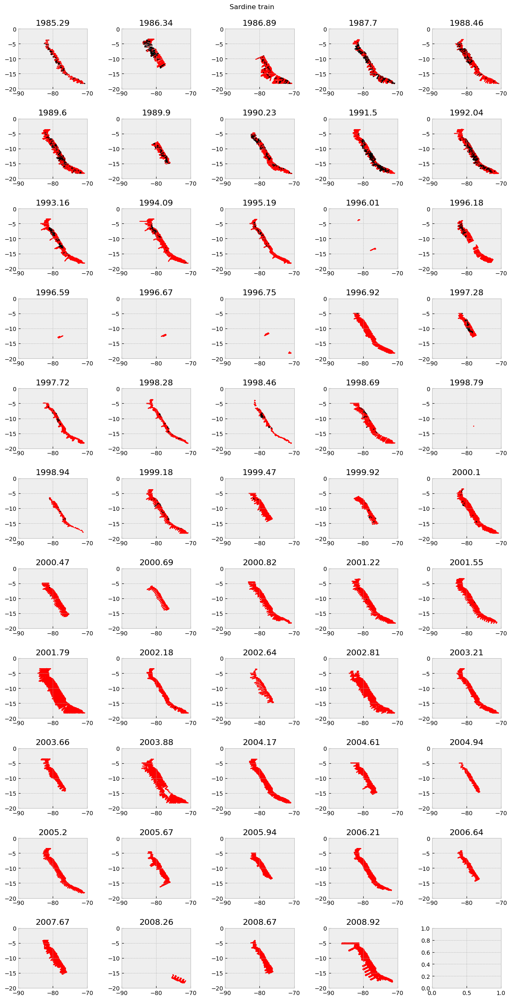

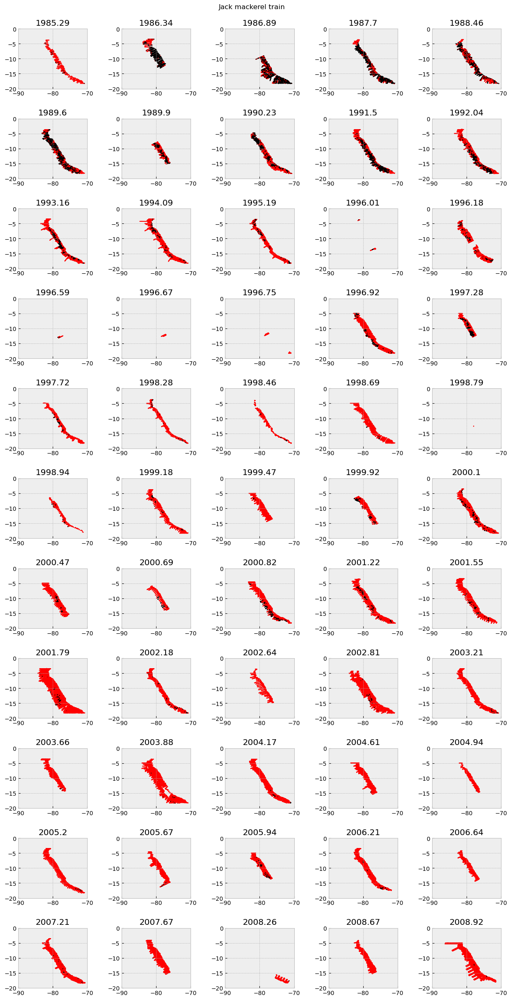

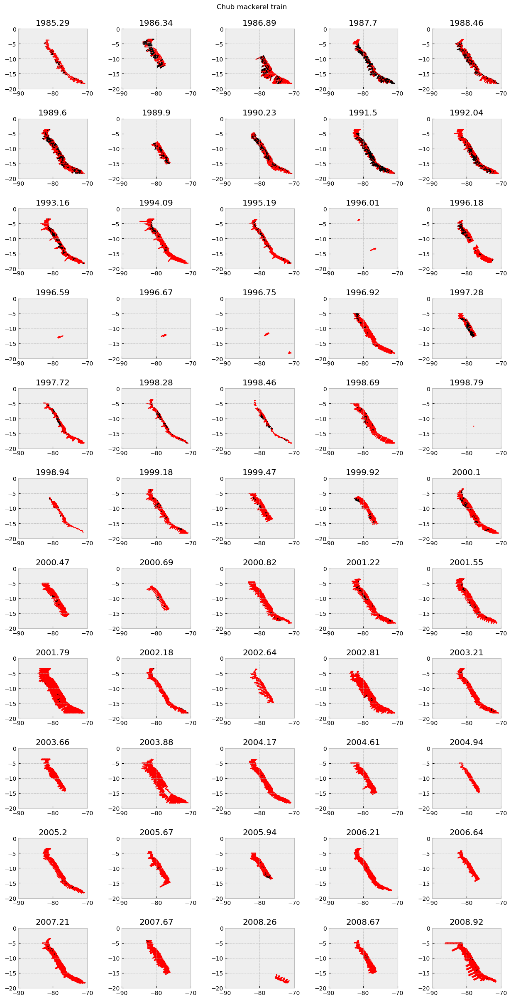

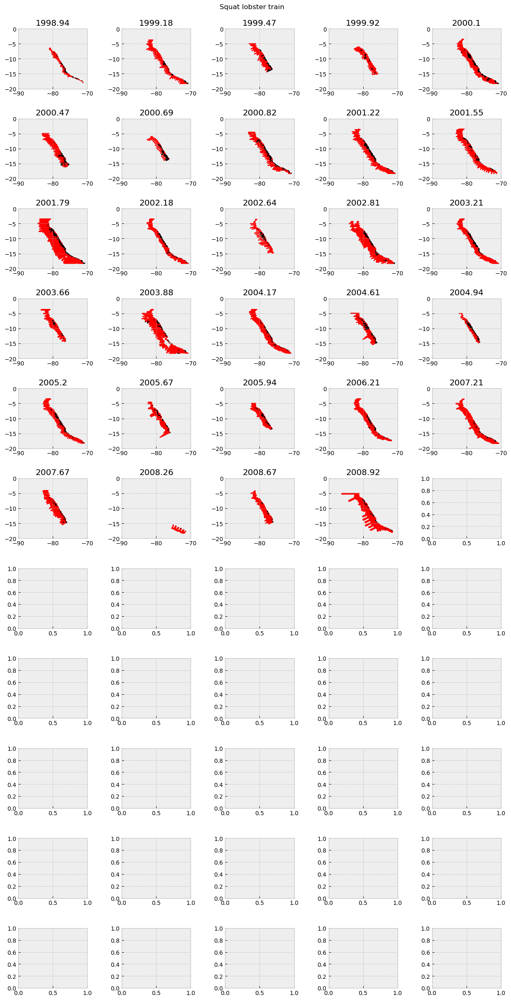

...

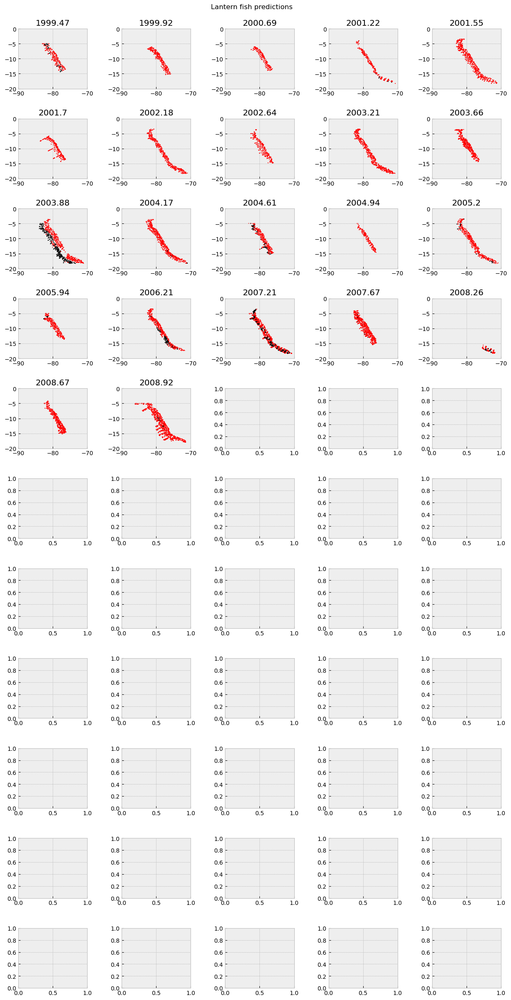

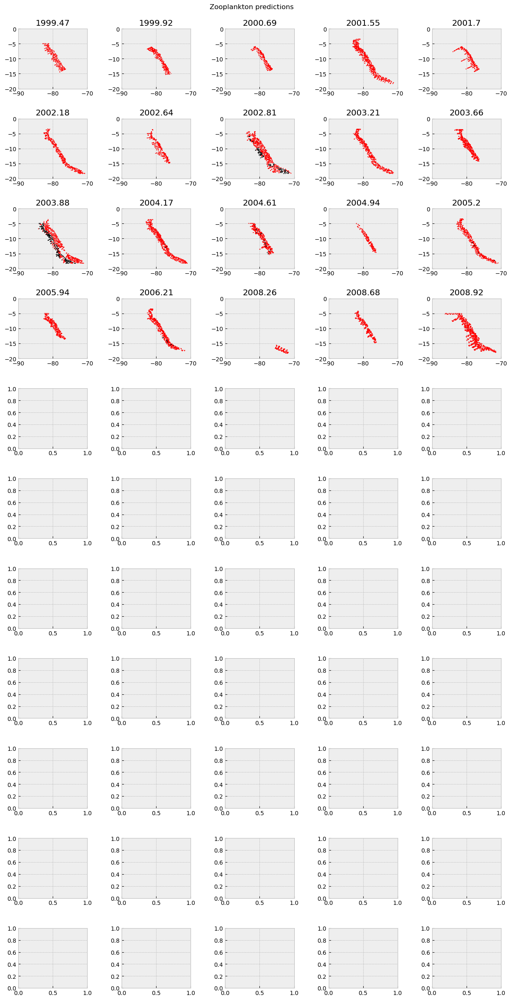

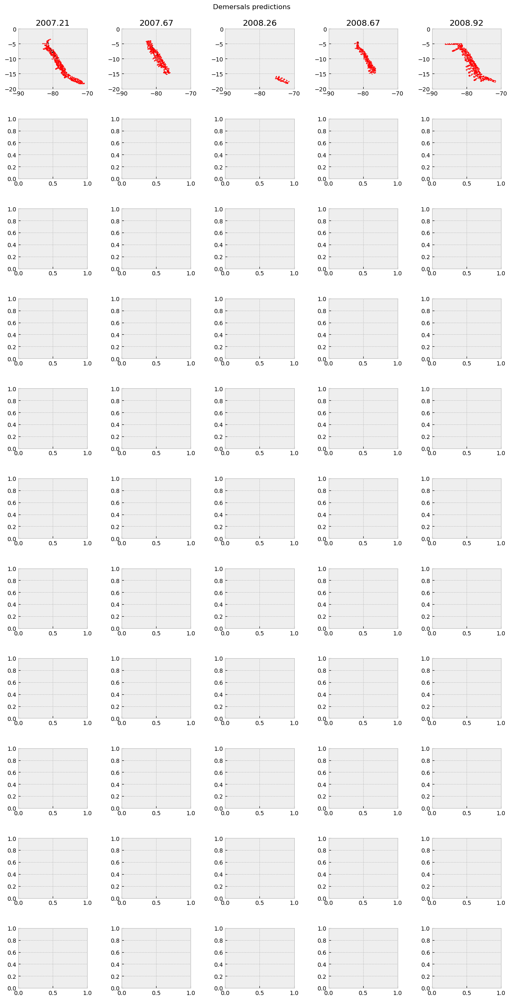

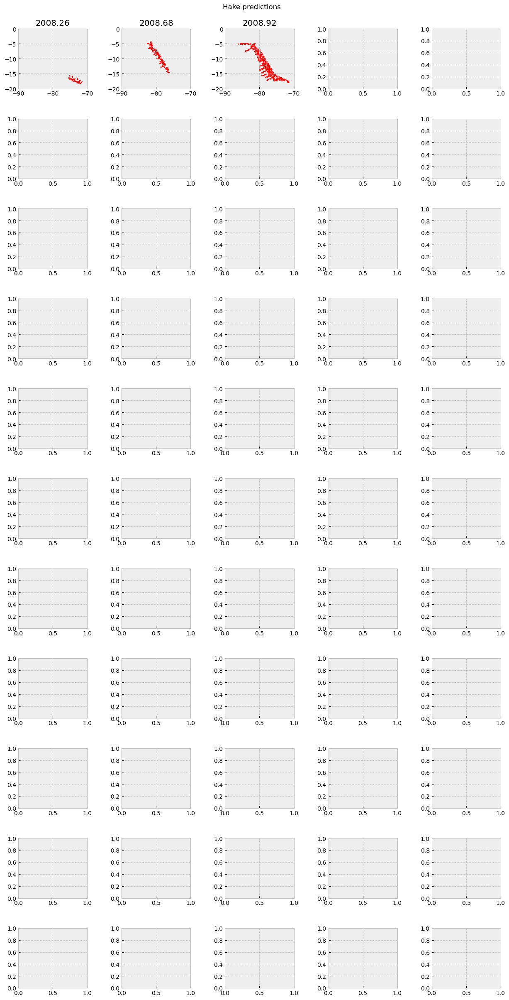

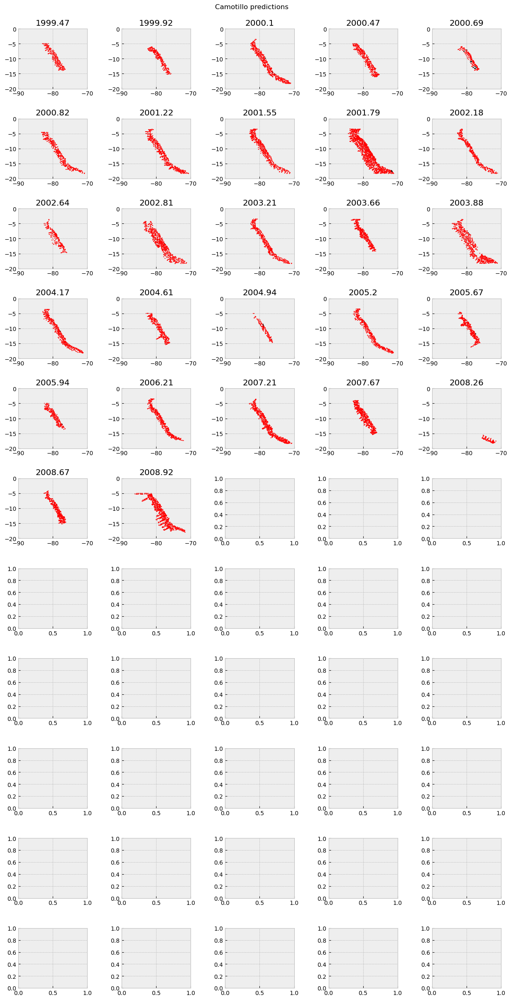

In [29]:
# Species presence-absence

#plotMaps(cruises_xxs, cruises_yys, mainTitle = "all")
plotMaps(cruises_x_trains, cruises_y_trains, mainTitle = "train")
plotMaps(cruises_x_tests, cruises_y_tests, mainTitle = "test")
plotMaps(cruises_x_tests, cruises_predictions, mainTitle = "predictions")

The presence absence with randomly separated train and test data works very well.

#### Time-series prediction with a random forest classifier

In this part of the project I'll use the first part of the dataset as train and the second part as test to get an actual time-series prediction.

Note: This part of the script is not working after cleaning up so I'll have to fix it later on.

In [64]:
# A stupid way to guess where to cut the data
# But it works hehe
print(xx.shape)
print(xx[:,2])
print(xx[20000,5])
print(xx[90000,5])
print(xx[53500,5]) # Split here to be able to predict El Niño
print(xx[157000,5]) # And here to get more train values
print(xx[220000,5])
print(yy.shape)

(217135, 8)


InvalidIndexError: (slice(None, None, None), 2)

In [65]:
splitSpot = 157000 #53500
xTrain = xx[0:splitSpot,:]
xTest = xx[splitSpot:-1,:]
yTrain = yy[0:splitSpot]
yTest = yy[splitSpot:-1]

print(xTrain)
print(xTest)
print(yTrain)
print(yTest)

InvalidIndexError: (slice(0, 157000, None), slice(None, None, None))

In [66]:
# Initialise
rf_timeseries = RandomForestClassifier(n_estimators = 100, random_state = 0)

# Fit
rf_timeseries.fit(xTrain,yTrain)

NameError: name 'xTrain' is not defined

In [67]:
# Predict values
yPred = rf_timeseries.predict(xTest)
rf_timeseries_acc = metrics.accuracy_score(yTest, yPred)
print(rf_timeseries_acc)

NameError: name 'xTest' is not defined

## Conclusion

The regressor random forest is not able to predict fish abundances.
The calassification random forest can predict presence and absence of fish with a good precision. However, this is because the test and train data are very similar. Once test and train data are separated as different sections of the timeseries, the accuracy of the RF decreases a lot :(